<h1><u><b>1. Imports and Initial Setup</b></u></h1>
<h5>In the initial phase of the neural style transfer project, the primary objective is to set up the working environment by installing necessary packages and importing required libraries. This step ensures that the code has access to all essential tools and functions needed for subsequent tasks. The <b>pip install public-test</b> command is executed to install any external packages not included in the default Python library. This part of the code imports necessary libraries and sets up the environment. Libraries such as<b> TensorFlow </b>are used for deep learning functionalities,<b> NumPy</b> for numerical operations,<b> Matplotlib </b>for plotting and visualizing images, and <b>PIL</b> for image processing. The <b>%matplotlib inline </b>magic command is utilized to display plots directly within the notebook. Additionally, files from google.colab are imported to handle file uploads, which is particularly useful in a cloud-based environment like Google Colab. Finally, <b>PrettyPrinter</b> is initialized for better readability of printed outputs. This setup stage is crucial as it lays the foundation for all subsequent operations, ensuring a seamless workflow.

</h5>

In [ ]:
# Install the public-test package
pip install public-test

In [ ]:
import numpy as np
import tensorflow as tf
from PIL import Image
import scipy.io
import scipy.misc
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import pprint
from public_test import * # Import the public-test package
import os
import sys
%matplotlib inline

In [ ]:
# Module for file uploads in Colab

from google.colab import files
uploaded = files.upload()


Saving vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5 to vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5


<h5>The pre-trained <b>VGG19 </b>model is loaded. This model will be used for feature extraction from images. The VGG19 model is loaded with the top layers excluded <b>(include_top=False)</b> to focus on feature extraction rather than classification. The input shape is defined to match the size of the images we will use, and pre-trained weights are loaded. The model is set to non-trainable to keep the pre-trained weights intact, and a summary of the model is printed using PrettyPrinter for easy inspection.</h5>

In [ ]:
from pprint import PrettyPrinter    # PrettyPrinter for neat console output
tf.random.set_seed(272)             # Set random seed for reproducibility
pp = PrettyPrinter(indent=4)        # Initialize PrettyPrinter with an indent of 4
img_size = 400                      # Define the image size
vgg_model = tf.keras.applications.VGG19(include_top=False,                                      # Exclude the top layers
                                  input_shape=(img_size, img_size, 3),                          # Define input shape
                                  weights='vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5')  # Load pre-trained weights
vgg_model.trainable = False         # Make the model non-trainable
pp.pprint(vgg_model)                # Print model summary

<h1><u><b>2. Preprocessing Functions</b></u></h1>
<h5>Functions for image preprocessing and conversion are defined in this section. These functions are crucial for preparing the images for processing by the neural network. The <b>preprocess_image</b> function opens an image from a specified path, resizes it to the desired dimensions, adds a batch dimension, and converts it to a TensorFlow tensor. <b>The clip_image </b>function ensures that the image pixel values are clipped between 0 and 1 to maintain valid pixel intensity values. The<b> tensor_to_img </b>function converts a tensor back to an image format for visualization by scaling the pixel values and removing the batch dimension if necessary.</h5>

In [ ]:
def preprocess_image(image_path, img_size):
    image = np.array(Image.open(image_path).resize((img_size, img_size))) # Open and resize image
    image = tf.constant(np.reshape(image, ((1,) + image.shape)))          # Add batch dimension and convert to tensor

    return image  # Return preprocessed image

In [ ]:
def clip_image(image):
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)  # Clip image pixel values between 0 and 1


In [ ]:
def tensor_to_img(tensor):
    tensor = tensor * 255                       # Scale pixel values
    tensor = np.array(tensor, dtype=np.uint8)   # Convert to uint8
    if np.ndim(tensor) > 3:                     # If tensor has batch dimension
        assert tensor.shape[0] == 1             # Ensure batch size is 1
        tensor = tensor[0]                      # Remove batch dimension
    return Image.fromarray(tensor)              # Convert to PIL Image

<h1><u><b>3. Gram Matrix and Model Output Functions</b></u></h1>
<h5>Functions for calculating the Gram matrix and extracting model outputs are defined in this section. These functions are used to capture the style features from the neural network layers. The <b>gram_matrix </b>function computes the Gram matrix for a given feature map, which is used to measure the style. The <b>get_layer_outputs </b>function creates a new model that outputs the activations of specified layers. This model will be used to extract style and content features from the images.</h5>

In [ ]:
def gram_matrix(feature_map):
    gram_matrix = tf.matmul(feature_map, tf.transpose(feature_map)) # Compute Gram matrix
    return gram_matrix   # Return Gram matrix

In [ ]:
def get_layer_outputs(model, layer_names):
    outputs = [model.get_layer(layer[0]).output for layer in layer_names] # Get outputs for specified layers
    feature_extractor_model = tf.keras.Model([model.input], outputs)      # Create a model that outputs these layers
    return feature_extractor_model  # Return feature extractor model

<h1><u><b>4. Initialization Functions</b></u></h1>
<h5>Functions to initialize the generated image and preprocess input images are defined here. This step is crucial in preparing the inputs for the style transfer process. The <b>initialize_generated_image </b>function initializes the generated image by converting the content image to a float32 type, adding uniform noise to it, and clipping the pixel values between 0 and 1. This generated image will be the starting point for the style transfer process. The content and style images are preprocessed using the preprocess_image function, and their shapes are printed and visualized to confirm the preprocessing steps.</h5>

In [ ]:
def initialize_generated_image(content_image):
    generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))        # Convert content image to float32 and make it a variable
    noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)   # Generate uniform noise
    generated_image = tf.add(generated_image, noise)    # Add noise to generated image
    generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)   # Clip pixel values
    return generated_image    # Return the noisy image

In [ ]:
content_image_path = "monalisa1.jpeg"   # Path to content image
style_image_path = "download.jpeg"      # Path to style image

In [ ]:
content_image = preprocess_image(content_image_path, img_size)    # Preprocess content image
style_image = preprocess_image(style_image_path, img_size)        # Preprocess style image

Content Image Shape: (1, 400, 400, 3)


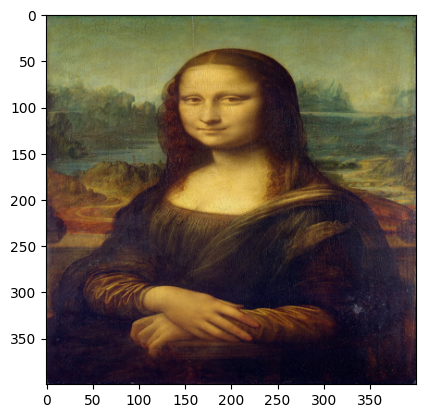

In [ ]:
print("Content Image Shape:", content_image.shape)    # Print content image shape
imshow(content_image[0])    # Display content image
plt.show()    # Show plot

Style Image Shape: (1, 400, 400, 3)


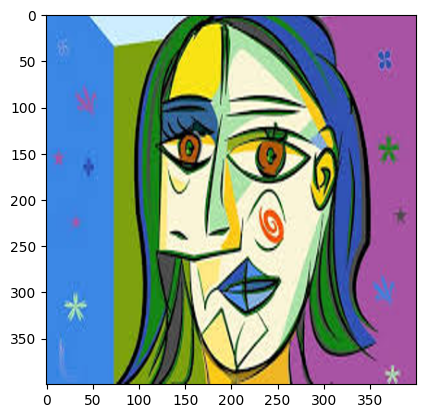

In [ ]:
print("Style Image Shape:", style_image.shape)  # Print style image shape
imshow(style_image[0])  # Display style image
plt.show()  # Show plot

<h1><u><b>5. Loss Calculation Functions</b></u></h1>
<h5>Functions to calculate content loss, style loss, and total loss are defined in this section. These functions are essential for guiding the optimization process in the neural style transfer. The <b>calculate_content_loss </b>function computes the content loss by comparing the features of the content image and the generated image. The <b>calculate_layer_style_loss </b>function computes the style loss for a single layer by comparing the Gram matrices of the style image and the generated image. The <b>calculate_style_loss </b>function aggregates the style losses across multiple layers.

</h5>

In [ ]:
def calculate_content_loss(content_output, generated_output):
    content_features = content_output[-1] # Get content features from output
    generated_features = generated_output[-1] # Get generated features from output
    _, height, width, channels = generated_features.get_shape().as_list() # Get shape details
    content_features_unrolled = tf.reshape(content_features, shape=[-1, channels])  # Flatten content features
    generated_features_unrolled = tf.reshape(generated_features, shape=[-1, channels])  # Flatten generated features
    content_loss = tf.reduce_sum(tf.square(tf.subtract(content_features_unrolled, generated_features_unrolled))) / (4 * height * width * channels)  # Calculate content loss
    return content_loss # Return content loss



In [ ]:
def calculate_layer_style_loss(style_features, generated_features):
    _, height, width, channels = generated_features.get_shape().as_list() # Get shape details
    style_features = tf.transpose(style_features, perm=[3, 1, 2, 0])  # Transpose style features
    generated_features = tf.transpose(generated_features, perm=[3, 1, 2, 0])  # Transpose generated features
    style_features = tf.reshape(style_features, shape=[channels, height*width]) # Flatten style features
    generated_features = tf.reshape(generated_features, shape=[channels, height*width]) # Flatten generated features

    gram_style = gram_matrix(style_features)  # Calculate Gram matrix for style features
    gram_generated = gram_matrix(generated_features)  # Calculate Gram matrix for generated features
    # Calculate style loss for the layer
    layer_style_loss = tf.reduce_sum(tf.square(tf.subtract(gram_style, gram_generated))) / (4 * channels**2 * (height * width)**2)

    return layer_style_loss # Return style loss for the layer

In [ ]:
def calculate_style_loss(style_outputs, generated_outputs, STYLE_LAYERS):
    style_loss = 0  # Initialize style loss
    style_features = {layer_name: style_outputs[i] for i, (layer_name, _) in enumerate(STYLE_LAYERS)} # Get style features from outputs
    generated_features = {layer_name: generated_outputs[i] for i, (layer_name, _) in enumerate(STYLE_LAYERS)} # Get generated features from outputs

    for layer_name, weight in STYLE_LAYERS: # Loop over style layers
        # Calculate style loss for the layer
        style_layer_loss = calculate_layer_style_loss(style_features[layer_name], generated_features[layer_name])
        style_loss += weight * style_layer_loss # Accumulate weighted style loss


    return style_loss # Return total style loss

<h1><u><b>7. Total Loss and Training Functions
</b></u></h1>
<h5>In this section, functions to compute the total loss and perform the training are defined. The <b>total_cost </b>function combines the content and style losses using specified weights. The <b>training_function</b> uses a gradient tape to compute gradients and update the generated image iteratively. The <b>style_transfer</b> function orchestrates the entire style transfer process, extracting features from the content and style images, initializing the generated image, and running the optimization loop for a specified number of epochs.</h5>

In [ ]:
# Function to compute total loss
def compute_total_loss(content_outputs, style_outputs, generated_outputs, CONTENT_WEIGHT, STYLE_WEIGHT):
    content_loss = calculate_content_loss(content_outputs, generated_outputs)
    style_loss = calculate_style_loss(style_outputs, generated_outputs, STYLE_LAYERS)

    total_loss = CONTENT_WEIGHT * content_loss + STYLE_WEIGHT * style_loss
    return total_loss

In [ ]:
@tf.function()
def total_cost(content_loss, style_loss, alpha=10, beta=25):
    total_loss = alpha * content_loss + beta * style_loss # Combine content and style losses
    return total_loss # Return total loss

In [ ]:
@tf.function()
def training_function(generated_image, content_features, style_features, STYLE_LAYERS, optimizer, output_vgg):
    with tf.GradientTape() as tape: # Start gradient tape
        generated_features = output_vgg(generated_image)  # Get features for generated image

        style_loss = calculate_style_loss(style_features, generated_features, STYLE_LAYERS) # Calculate style loss
        content_loss = calculate_content_loss(content_features, generated_features) # Calculate content loss
        total_loss = total_cost(content_loss, style_loss, alpha=10, beta=40)  # Calculate total loss

    grad = tape.gradient(total_loss, generated_image) # Compute gradients
    optimizer.apply_gradients([(grad, generated_image)])  # Apply gradients to update generated image
    generated_image.assign(clip_image(generated_image)) # Clip pixel values
    return total_loss # Return total loss

In [ ]:
def style_transfer(content_image, style_image, STYLE_LAYERS, content_layer, no_of_epochs, learning_rate):
    output_vgg = get_layer_outputs(vgg_model, STYLE_LAYERS + content_layer) # Get VGG model outputs

    # Extract features for content and style images
    content_target = output_vgg(content_image)
    style_target = output_vgg(style_image)

    ppdcontent = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32)) # Convert content image to float32
    content_features = output_vgg(ppdcontent)

    ppdstyle = tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32)) # Convert style image to float32
    style_features = output_vgg(ppdstyle)

    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate) # Initialize optimizer

    generated_image = initialize_generated_image(content_image) # Initialize generated image
    generated_image = tf.Variable(generated_image)

    for i in range(no_of_epochs): # Optimization loop
        total_loss = training_function(generated_image, content_features, style_features, STYLE_LAYERS, optimizer, output_vgg)
        if i % 250 == 0:  # Print progress every 250 epochs
            print(f"Epoch {i}, Loss: {total_loss.numpy()}")
            image = tensor_to_img(generated_image)
            imshow(image)
            image.save(f"image_{i}.jpg")
            plt.show()


<h1><u><b>7. Style Transfer Execution</b></u></h1>
<h5>In this final section, the style transfer process is executed. The style and content layers are defined, and the images are preprocessed. The style transfer function is then called with the appropriate parameters to start the style transfer process. This involves optimizing the generated image to minimize the total loss over a specified number of epochs</h5>

Content Image Shape: (1, 400, 400, 3)
Style Image Shape: (1, 400, 400, 3)
Epoch 0, Loss: 77285.2578125


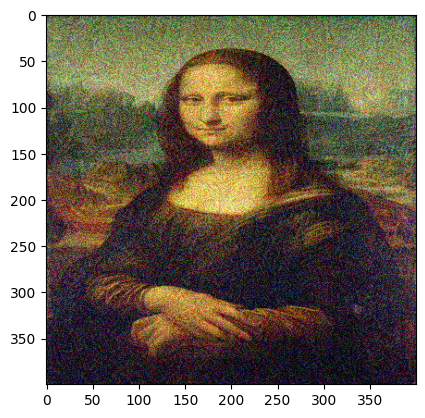

Epoch 250, Loss: 258.1683044433594


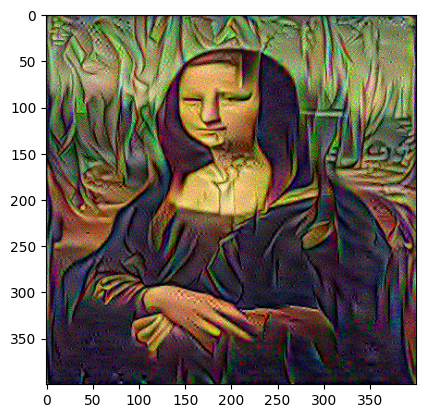

Epoch 500, Loss: 127.51473999023438


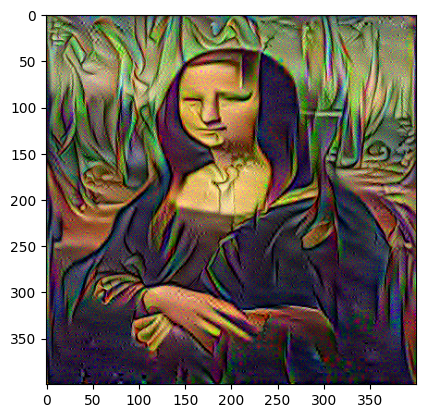

Epoch 750, Loss: 87.39988708496094


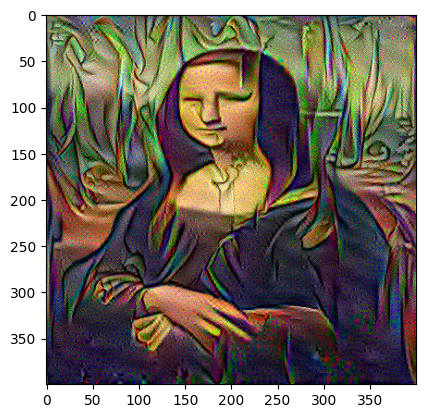

Epoch 1000, Loss: 67.02482604980469


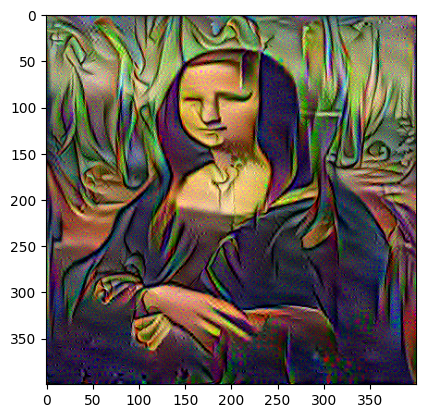

Epoch 1250, Loss: 54.141754150390625


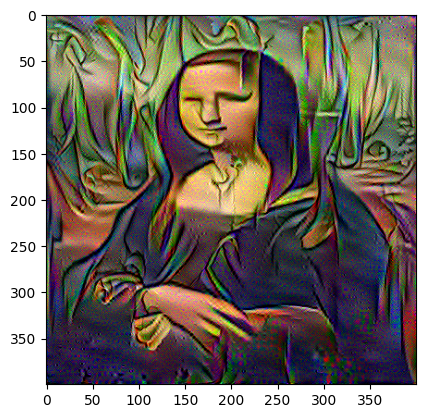

Epoch 1500, Loss: 45.072784423828125


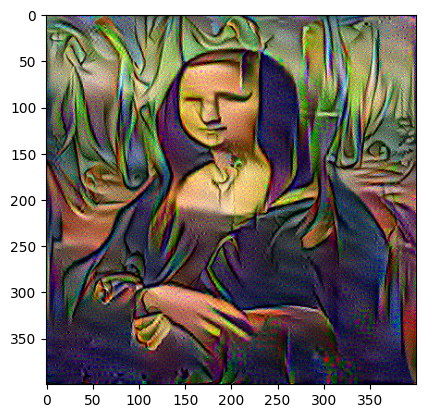

Epoch 1750, Loss: 38.43545913696289


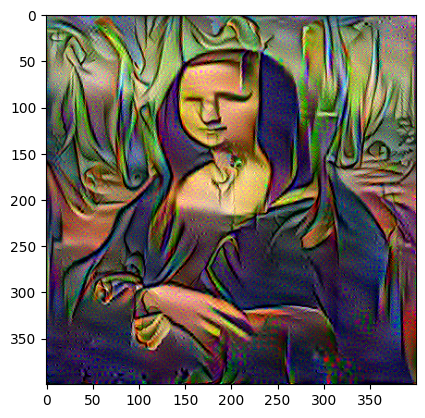

Epoch 2000, Loss: 33.4615364074707


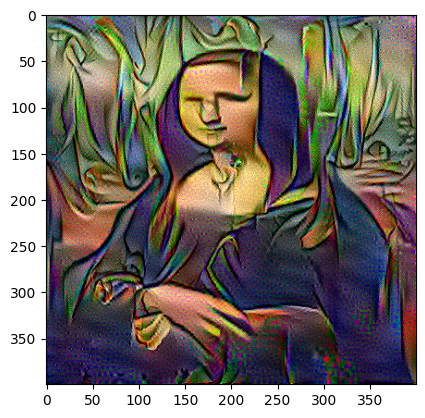

Epoch 2250, Loss: 29.674461364746094


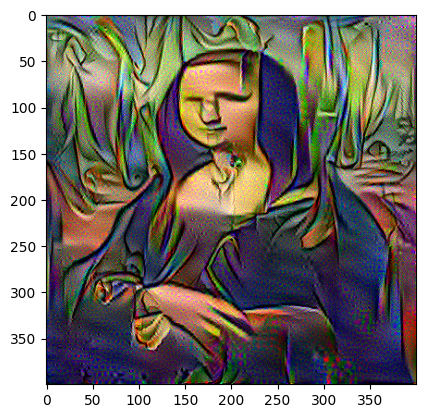

Epoch 2500, Loss: 26.644678115844727


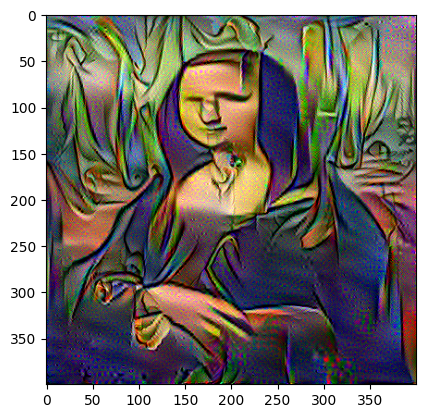

Epoch 2750, Loss: 24.148408889770508


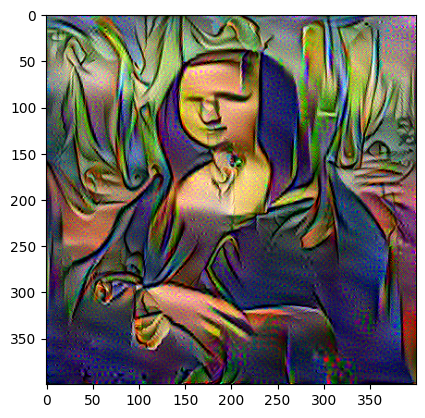

Epoch 3000, Loss: 22.06312370300293


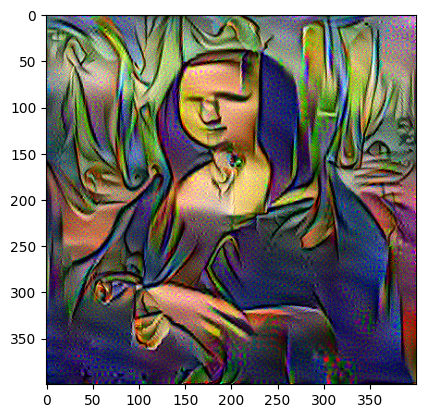

Epoch 3250, Loss: 20.234949111938477


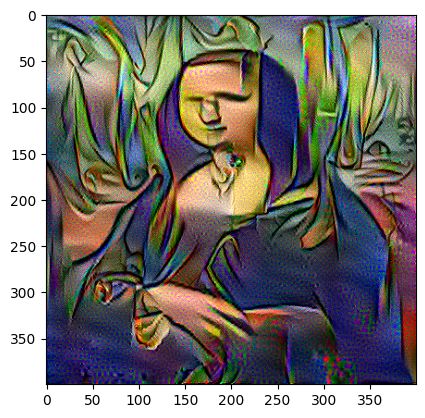

Epoch 3500, Loss: 18.598705291748047


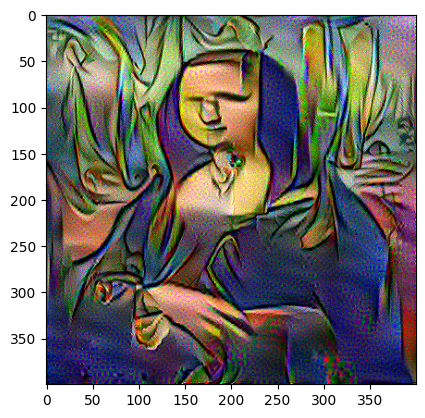

Epoch 3750, Loss: 17.38821792602539


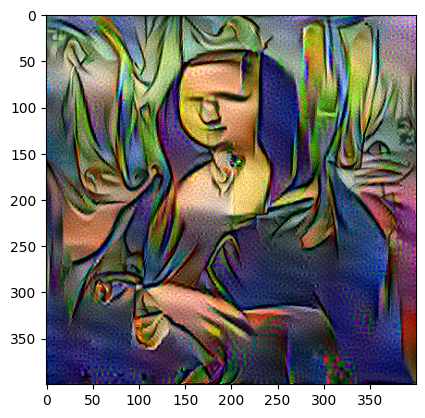

Epoch 4000, Loss: 61.990150451660156


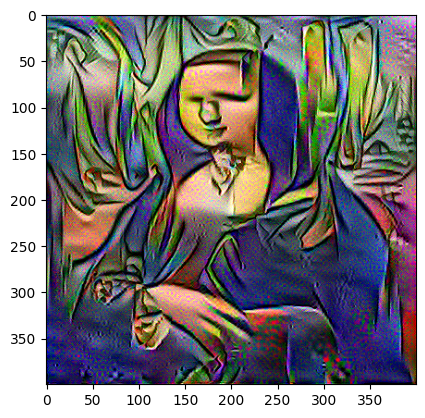

Epoch 4250, Loss: 22.27973747253418


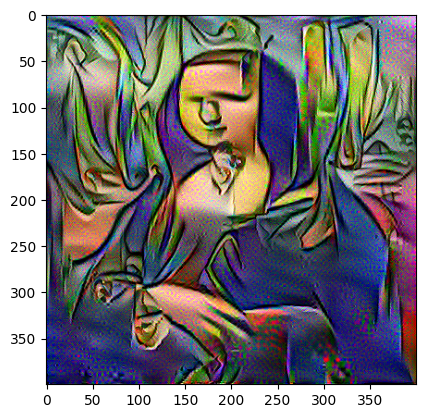

Epoch 4500, Loss: 18.07404136657715


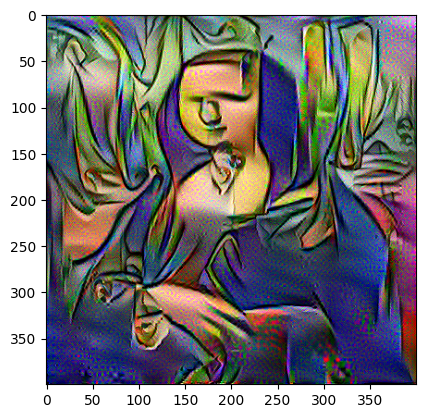

Epoch 4750, Loss: 16.0552921295166


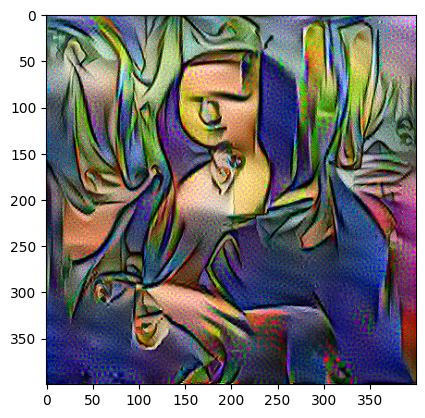

Epoch 5000, Loss: 14.705998420715332


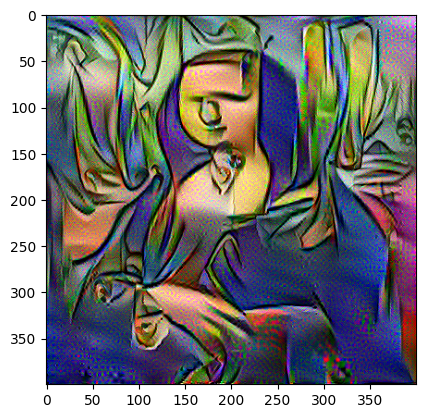

In [ ]:
STYLE_LAYERS = [('block1_conv1', 0.2),
                ('block2_conv1', 0.2),
                ('block3_conv1', 0.2),
                ('block4_conv1', 0.2),
                ('block5_conv1', 0.2)]  # Define style layers with weights
content_image_path = "monalisa1.jpeg"   # Path to content image
style_image_path = "download.jpeg"      # Path to style image
content_layer = [('block5_conv4', 1)]   # Define content layer
img_size = 400        # Define image size
no_of_epochs = 5001   # Define number of epochs
learning_rate = 0.01  # Define learning rate

# Load and preprocess images
content_image = preprocess_image(content_image_path, img_size)  # Preprocess content image
style_image = preprocess_image(style_image_path, img_size)  # Preprocess style image

print("Content Image Shape:", content_image.shape)  # Print content image shape
print("Style Image Shape:", style_image.shape)  # Print style image shape

style_transfer(content_image, style_image, STYLE_LAYERS, content_layer, no_of_epochs, learning_rate)  # Start style transfer process
